# Instalar librerías necesarias

In [1]:
pip install tensorflow==1.15


     |████████████████████████████████| 412.3MB 31kB/s 
     |████████████████████████████████| 512kB 42.7MB/s 
     |████████████████████████████████| 3.8MB 33.6MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=7dd6ef0e54ef2eb41eeb5df50b75f03ddfc534eec4a618051b1e7712770d3217
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.10.0 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Found existing installation: tensorflow-estimator 2.2.0
    Uninstalling tensorflow-estimator-2.2.0:
      Successfully uninstalled tensorflow-estimator-2.2.0
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3
  Found existing installation: tensorboard 2.2.2
    Uninstalling tensorboard-2.2.2:
      Successfully uninstalled tensorboard-2.2.2
  Found existing installation: 

# Instalaremos unas librerías adicionales que se requieren para trabajar con tensorflow


In [2]:
!apt-get install -qq protobuf-compiler python-pil python-lxml python-tk #serialización de grafos inferenciales

!pip install -q Cython contextlib2 pillow lxml matplotlib  #librerias para visualizar imagenes

!pip install -q pycocotools  #para trabajar con unas herramientas de http://cocodataset.org/

!pip install -q watermark   #imprimir marcas de fecha y hora, números de versión e información de hardware.


Selecting previously unselected package python-bs4.
(Reading database ... 144467 files and directories currently installed.)
Preparing to unpack .../0-python-bs4_4.6.0-1_all.deb ...
Unpacking python-bs4 (4.6.0-1) ...
Selecting previously unselected package python-pkg-resources.
Preparing to unpack .../1-python-pkg-resources_39.0.1-2_all.deb ...
Unpacking python-pkg-resources (39.0.1-2) ...
Selecting previously unselected package python-chardet.
Preparing to unpack .../2-python-chardet_3.0.4-1_all.deb ...
Unpacking python-chardet (3.0.4-1) ...
Selecting previously unselected package python-six.
Preparing to unpack .../3-python-six_1.11.0-2_all.deb ...
Unpacking python-six (1.11.0-2) ...
Selecting previously unselected package python-webencodings.
Preparing to unpack .../4-python-webencodings_0.5-2_all.deb ...
Unpacking python-webencodings (0.5-2) ...
Selecting previously unselected package python-html5lib.
Preparing to unpack .../5-python-html5lib_0.999999999-1_all.deb ...
Unpacking pyt

# Instalar tf_slim

In [3]:
pip install tf_slim

     |████████████████████████████████| 358kB 3.5MB/s 


# Si queremos ver que hardware y software tenemos instalado:


In [5]:
!python3 --version
%load_ext watermark
print("--Computer vision(hardware)--")
%watermark
%watermark -a "--Computer vision(libraries)--" -u -d -v -p numpy,tensorflow,pycocotools


Python 3.6.9
The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
--Computer vision(hardware)--
2020-06-03T17:41:18+00:00

CPython 3.6.9
IPython 5.5.0

compiler   : GCC 8.4.0
system     : Linux
release    : 4.19.104+
machine    : x86_64
processor  : x86_64
CPU cores  : 2
interpreter: 64bit
--Computer vision(libraries)-- 
last updated: 2020-06-03 

CPython 3.6.9
IPython 5.5.0

numpy 1.18.4
tensorflow 2.2.0
pycocotools 2.0.0


#Si queremos ver que la GPU esta activa para tensorflow o no


In [6]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print('GPU NO esta activa para el entorno')
tf.__version__


GPU NO esta activa para el entorno


'1.15.0'

# Habilitando el acceso a Google drive

In [7]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


# Clonaremos el repositorio de GITHUB object_detection (detección de objetos)

In [8]:
#descargamos el repositorio de object_detection que esta en GITHUB
%cd /content/gdrive/My\ Drive/deteccion_objetos
!git clone --quiet https://github.com/tensorflow/models.git

%cd /content/gdrive/My\ Drive/deteccion_objetos/models/research
!protoc object_detection/protos/*.proto --python_out=.
#cambiamos la variable de entorno para que sea ahora la del repositorio clonado
import os
os.environ['PYTHONPATH'] += ':/content/gdrive/My Drive/deteccion_objetos/models/research/:/content/gdrive/My Drive/deteccion_objetos/models/research/slim/'
!echo $PYTHONPATH
#probamos si quedo bien descargado y funcionando el repositorio de object_detection
!python object_detection/builders/model_builder_test.py


/content/gdrive/My Drive/deteccion_objetos
fatal: destination path 'models' already exists and is not an empty directory.
/content/gdrive/My Drive/deteccion_objetos/models/research
object_detection/protos/input_reader.proto: warning: Import object_detection/protos/image_resizer.proto but not used.
/env/python:/content/gdrive/My Drive/deteccion_objetos/models/research/:/content/gdrive/My Drive/deteccion_objetos/models/research/slim/


# Imágenes de entrenamiento

In [9]:
# Convierte los archivos xml que estan en la carpeta de entrenamiento a una lista CSV 
# y genera el archivo label_map.pbtxt en el directorio configuracion
!python /content/gdrive/My\ Drive/deteccion_objetos/xml_a_csv_v2.py \
--inputDir /content/gdrive/My\ Drive/deteccion_objetos/img_entrenamiento \
--outputFile /content/gdrive/My\ Drive/deteccion_objetos/csv/train_labels.csv --labelMapDir \
/content/gdrive/My\ Drive/deteccion_objetos/configuracion



Successfully converted xml to csv.
Generate `/content/gdrive/My Drive/deteccion_objetos/configuracion/label_map.pbtxt`


# Imágenes de test

In [10]:
!python /content/gdrive/My\ Drive/deteccion_objetos/xml_a_csv_v2.py --inputDir /content/gdrive/My\ Drive/deteccion_objetos/img_test --outputFile /content/gdrive/My\ Drive/deteccion_objetos/csv/test_labels.csv

Successfully converted xml to csv.


# Dataframe para Entrenamiento

In [11]:
# Generando el archivo  train.record
!python /content/gdrive/My\ Drive/deteccion_objetos/csv_a_tf_v2.py --csv_input=/content/gdrive/My\ Drive/deteccion_objetos/csv/train_labels.csv --output_path=/content/gdrive/My\ Drive/deteccion_objetos/TFRecords/train.record --img_path=/content/gdrive/My\ Drive/deteccion_objetos/img_entrenamiento --label_map /content/gdrive/My\ Drive/deteccion_objetos/configuracion/label_map.pbtxt




W0603 17:44:08.608646 140190317516672 module_wrapper.py:139] From /content/gdrive/My Drive/deteccion_objetos/csv_a_tf_v2.py:105: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0603 17:44:09.019083 140190317516672 module_wrapper.py:139] From /content/gdrive/My Drive/deteccion_objetos/csv_a_tf_v2.py:51: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/gdrive/My Drive/deteccion_objetos/TFRecords/train.record


# Crear dataframe de test


In [12]:
# Generando el archivo  test.record
!python /content/gdrive/My\ Drive/deteccion_objetos/csv_a_tf_v2.py --csv_input=/content/gdrive/My\ Drive/deteccion_objetos/csv/test_labels.csv --output_path=/content/gdrive/My\ Drive/deteccion_objetos/TFRecords/test.record --img_path=/content/gdrive/My\ Drive/deteccion_objetos/img_test --label_map /content/gdrive/My\ Drive/deteccion_objetos/configuracion/label_map.pbtxt




W0603 17:44:36.051326 140471861729152 module_wrapper.py:139] From /content/gdrive/My Drive/deteccion_objetos/csv_a_tf_v2.py:105: The name tf.python_io.TFRecordWriter is deprecated. Please use tf.io.TFRecordWriter instead.


W0603 17:44:36.535556 140471861729152 module_wrapper.py:139] From /content/gdrive/My Drive/deteccion_objetos/csv_a_tf_v2.py:51: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.

Successfully created the TFRecords: /content/gdrive/My Drive/deteccion_objetos/TFRecords/test.record


# Descargamos el modelo a nuestro entorno.


In [13]:
%cd /content/gdrive/My Drive/deteccion_objetos/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL = 'ssd_mobilenet_v2_coco_2018_03_29'
MODEL_FILE = MODEL + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'
DEST_DIR = '/content/gdrive/My Drive/deteccion_objetos/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(MODEL, DEST_DIR)


/content/gdrive/My Drive/deteccion_objetos/models/research


EOFError: ignored

# Verificamos que los archivos estén descargados


In [14]:
!echo {DEST_DIR}
!ls -alh /content/gdrive/My\ Drive/deteccion_objetos/models/research


/content/gdrive/My Drive/deteccion_objetos/models/research/pretrained_model
total 139M
drwx------  2 root root 4.0K May 27 19:54 a3c_blogpost
drwx------  2 root root 4.0K May 27 19:54 adversarial_crypto
drwx------  2 root root 4.0K May 27 19:54 adversarial_logit_pairing
drwx------  2 root root 4.0K May 27 19:54 adversarial_text
drwx------  2 root root 4.0K May 27 19:54 adv_imagenet_models
drwx------  2 root root 4.0K May 27 19:54 attention_ocr
drwx------  2 root root 4.0K May 27 19:54 audioset
drwx------  2 root root 4.0K May 27 19:54 autoaugment
drwx------  2 root root 4.0K May 27 19:54 autoencoder
drwx------  2 root root 4.0K May 27 19:54 brain_coder
drwx------  2 root root 4.0K May 27 19:54 cognitive_mapping_and_planning
drwx------  2 root root 4.0K May 27 19:54 cognitive_planning
drwx------  2 root root 4.0K May 27 19:54 compression
drwx------  2 root root 4.0K May 27 19:54 cvt_text
drwx------  2 root root 4.0K May 27 19:54 deep_contextual_bandits
drwx------  2 root root 4.0K May 2

# Por último la configuración del modelo que usaremos

In [0]:
MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
        'pipeline_file': 'ssd_mobilenet_v2_coco.config',
        'batch_size': 12
    },
    'faster_rcnn_inception_v2': {
        'model_name': 'faster_rcnn_inception_v2_coco_2018_01_28',
        'pipeline_file': 'faster_rcnn_inception_v2_pets.config',
        'batch_size': 12
    },
    'rfcn_resnet101': {
        'model_name': 'rfcn_resnet101_coco_2018_01_28',
        'pipeline_file': 'rfcn_resnet101_pets.config',
        'batch_size': 8
    }
}
#variables con las rutas de nuestras dataset de entrenamiento
test_record_fname = '/content/gdrive/My Drive/deteccion_objetos/TFRecords/test.record'
train_record_fname = '/content/gdrive/My Drive/deteccion_objetos/TFRecords/train.record'
label_map_pbtxt_fname = '/content/gdrive/My Drive/deteccion_objetos/configuracion/label_map.pbtxt'

# Necesitaremos definir varios parámetros para el entrenamiento de la red neuronal.


In [0]:
# ubicación del archivo donde esta el modelo con el que iniciaremos el entrenamiento
fine_tune_checkpoint = os.path.join(DEST_DIR, "model.ckpt")
fine_tune_checkpoint

# número de pasos (epochs) que usaremos para entrenar
num_steps = 2000  # recomiendo mínimo 200000 pero probaremos con 2000

# número de evaluaciones por pasos (cada 50 pasos evaluamos el modelo).
num_eval_steps = 50

# Selecionamos el archivo de configuración del modelo
selected_model = 'ssd_mobilenet_v2'

# Nombre del modelo de detección de objectos que usaremos
MODEL = MODELS_CONFIG[selected_model]['model_name']

# Nombre del archivo de canalización en la API de detección de objetos de tensorflow.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# definimos el tamaño del lote de entrenamiento para uso en la memoria de 
# la GPU Tesla K80 de Colaborate para el modelo seleccionado.
batch_size = MODELS_CONFIG[selected_model]['batch_size']


# Cargamos el archivo para agregar los hiperparametros.


In [17]:
import os
pipeline_fname = os.path.join('/content/gdrive/My Drive/deteccion_objetos/models/research/object_detection/samples/configs/', pipeline_file)

print(pipeline_fname)
assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)


/content/gdrive/My Drive/deteccion_objetos/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config


# Creamos una función que nos permitirá leer las etiquetas y categorías del archivo de configuración de la pipeline.


In [0]:
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())


# Agregamos nuestras clases al archivo de configuración de la pipeline


In [0]:
import re

num_classes = get_num_classes(label_map_pbtxt_fname)
with open(pipeline_fname) as f:
    s = f.read()
with open(pipeline_fname, 'w') as f:
    
    # punto de control de inicio
    s = re.sub('fine_tune_checkpoint: ".*?"','fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # ubicación de los tfrecords de train y test
    s = re.sub('(input_path: ".*?)(train.record)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub('(input_path: ".*?)(val.record)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # ubicación del labelmap.pbtxt
    s = re.sub('label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Establecemos el tamaño del lote de entrenamiento
    s = re.sub('batch_size: [0-9]+','batch_size: {}'.format(batch_size), s)

    # Establecemos la cantidad de pasos de entrenamiento
    s = re.sub('num_steps: [0-9]+','num_steps: {}'.format(num_steps), s)
    
    # establecemos el número de clases (etiquetas)
    s = re.sub('num_classes: [0-9]+','num_classes: {}'.format(num_classes), s)
    f.write(s)


# Revisamos que todo haya quedado como se requiere


In [20]:
!cat {pipeline_fname}


cat: /content/gdrive/My: No such file or directory
cat: Drive/deteccion_objetos/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config: No such file or directory


# Creamos el directorio donde se va a generar el modelo de inferencia.


In [21]:
# No ejecutar
model_dir = 'training/'
# borrar archivos de la carpeta donde se guardara el modelo
#!rm -rf {model_dir}
os.makedirs(model_dir, exist_ok=True)

print(model_dir)

training/


# 4.4.1 Instalar tensorboard

# Descargar y descomprimir tensorboard.


In [22]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip -o ngrok-stable-linux-amd64.zip


--2020-06-03 17:45:27--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 3.229.170.137, 3.214.214.70, 3.90.94.177, ...
Connecting to bin.equinox.io (bin.equinox.io)|3.229.170.137|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13773305 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip.8’

ngrok-stable-linux- 100%[===================>]  13.13M  34.5MB/s    in 0.4s    

2020-06-03 17:45:27 (34.5 MB/s) - ‘ngrok-stable-linux-amd64.zip.8’ saved [13773305/13773305]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   


# Almacenar el log del proceso de entrenamiento y sus checkpoints del entrenamiento.


In [0]:
LOG_DIR = model_dir
get_ipython().system_raw(
    'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
    .format(LOG_DIR)
)
get_ipython().system_raw('./ngrok http 6006 &')


# Generar el link de tensorboard


In [25]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"


https://51322cbc906e.ngrok.io


# 4.5 Entrenar el modelo de inferencia


In [0]:
!python /content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/model_main.py \
    --pipeline_config_path=/content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --num_eval_steps={num_eval_steps}


In [26]:
%cd /content
# Forma de entrenamiento heredada (también funciona).
!python /content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/legacy/train.py \
--alsologtostderr \
--train_dir /content/gdrive/My\ Drive/deteccion_objetos/models/research/training \
--pipeline_config_path /content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config

/content
Instructions for updating:
Use object_detection/model_main.py.
W0603 17:46:00.087754 140027663538048 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/absl/app.py:250: main (from __main__) is deprecated and will be removed in a future version.
Instructions for updating:
Use object_detection/model_main.py.
Instructions for updating:
Please switch to tf.train.create_global_step
W0603 17:46:00.340592 140027663538048 deprecation.py:323] From /content/gdrive/My Drive/deteccion_objetos/models/research/object_detection/legacy/trainer.py:265: create_global_step (from tf_slim.ops.variables) is deprecated and will be removed in a future version.
Instructions for updating:
Please switch to tf.train.create_global_step
W0603 17:46:00.369001 140027663538048 dataset_builder.py:84] num_readers has been reduced to 1 to match input file shards.
Instructions for updating:
Use `tf.data.experimental.parallel_interleave(...)`.
W0603 17:46:00.376387 140027663538048 deprecation.py:323] 

# Para ver listado de archivos creados después del entrenamiento:


In [27]:
!ls {model_dir}


ls: cannot access 'training/': No such file or directory


In [0]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


# 5 Congelar/Exportar modelo


In [28]:
import re
import numpy as np

output_directory = './fine_tuned_model'

lst = os.listdir('/content/gdrive/My Drive/deteccion_objetos/models/research/training/')
lst = [l for l in lst if 'model.ckpt-' in l and '.meta' in l]
steps=np.array([int(re.findall('\d+', l)[0]) for l in lst])
last_model = lst[steps.argmax()].replace('.meta', '')

last_model_path = os.path.join('/content/gdrive/My\ Drive/deteccion_objetos/models/research/training/', last_model)
print(last_model_path)
!python /content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/export_inference_graph.py \
    --input_type=image_tensor \
    --pipeline_config_path=/content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config \
    --output_directory={output_directory} \
    --trained_checkpoint_prefix={last_model_path}



/content/gdrive/My\ Drive/deteccion_objetos/models/research/training/model.ckpt-2005
Instructions for updating:
Please use `layer.__call__` method instead.
W0603 17:47:33.546150 140499367917440 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0603 17:47:36.072584 140499367917440 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0603 17:47:36.120671 140499367917440 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0603 17:47:36.322221 140499367917440 convolutional_box_predictor.py:156] depth of 

# 6 descargar modelo .pb


In [29]:
import os

# ./fine_tuned_model
#pb_fname = os.path.join(os.path.abspath("/content/gdrive/My Drive/deteccion_objetos/models/research/fine_tuned_model"), "frozen_inference_graph.pb")
pb_fname = os.path.join(os.path.abspath(output_directory), "frozen_inference_graph.pb")
assert os.path.isfile(pb_fname), '`{}` not exist'.format(pb_fname)
!ls -alh {pb_fname}
from google.colab import files
#descargamos el modelo
files.download(pb_fname)
#descargamos el mapa de etiquetas.
files.download(label_map_pbtxt_fname)




-rw-r--r-- 1 root root 19M Jun  3 17:47 /content/fine_tuned_model/frozen_inference_graph.pb


In [30]:
import os
import glob

# Ruta del gráfo de detección congelado. Este es el modelo real que se utiliza para la detección de objetos.
PATH_TO_CKPT = pb_fname

# Lista de las cadenas que se utilizan para agregar la etiqueta correcta para cada cuadro.
PATH_TO_LABELS = label_map_pbtxt_fname

# ruta donde estan las imágenes para probar
PATH_TO_TEST_IMAGES_DIR =  "/content/gdrive/My Drive/deteccion_objetos/img_prueba"

assert os.path.isfile(pb_fname)
assert os.path.isfile(PATH_TO_LABELS)
TEST_IMAGE_PATHS = glob.glob(os.path.join(PATH_TO_TEST_IMAGES_DIR, "*.*"))
assert len(TEST_IMAGE_PATHS) > 0, 'No image found in `{}`.'.format(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)



['/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_1.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_2.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_3.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_4.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_5.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_6.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_7.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_8.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_9.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_10.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_1.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_2.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_3.jpg', '/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_4.jpg', '/content/gdrive/My Drive/deteccion_obje

# Pasamos cada una de las imágenes por el grafo y luego las visualizamos


/content/gdrive/My Drive/deteccion_objetos/models/research/object_detection
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_1.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_2.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_3.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_4.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_5.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_6.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_7.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_8.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_9.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/horse_10.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_1.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_2.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_3.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_4.jpg
/conten

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:115: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_3.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_4.jpeg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_5.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_6.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_7.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_8.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_9.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/sheep_10.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_horse_sheep_1.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_horse_sheep_2.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_horse_sheep_3.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_horse_sheep_4.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_horse_sheep_5.jpg
/content/gdrive/My Drive/deteccion_objetos/img_prueba/cow_horse_sheep_6.jpg
/content/gdriv

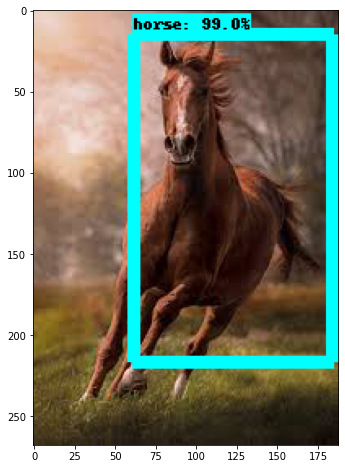

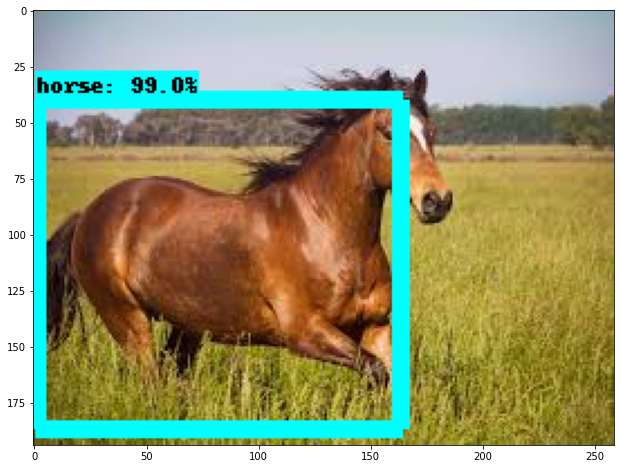

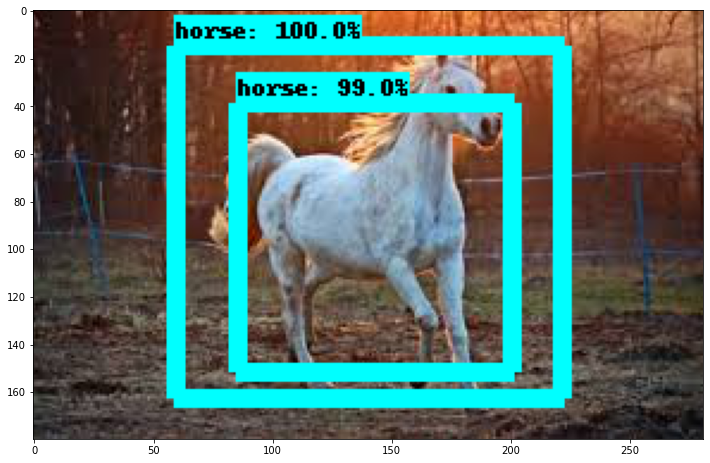

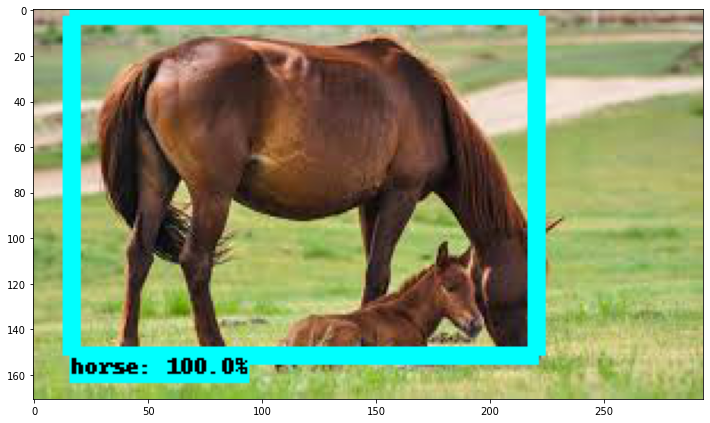

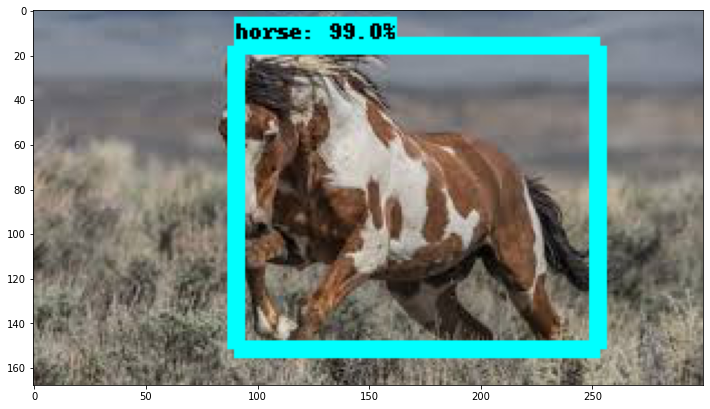

...

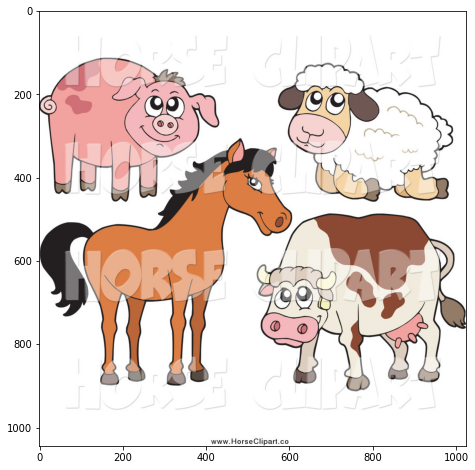

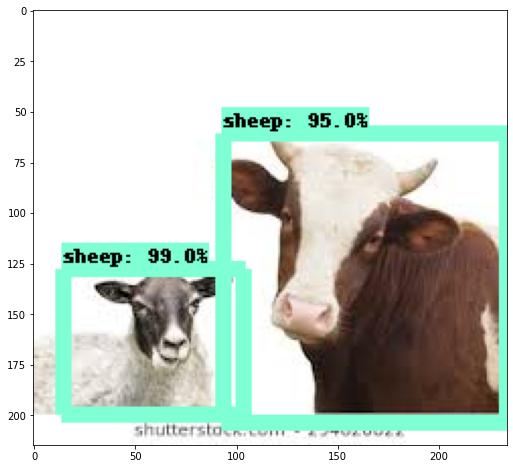

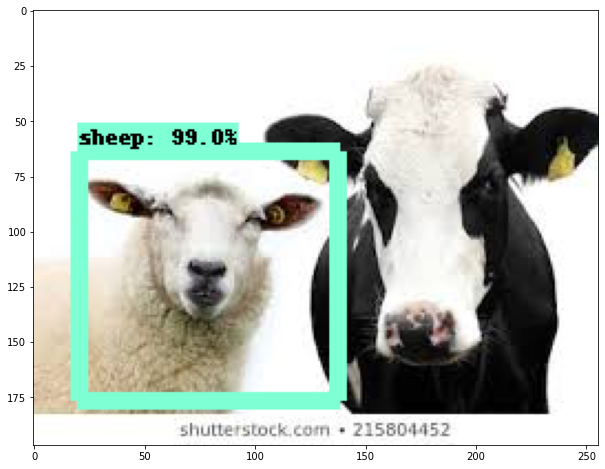

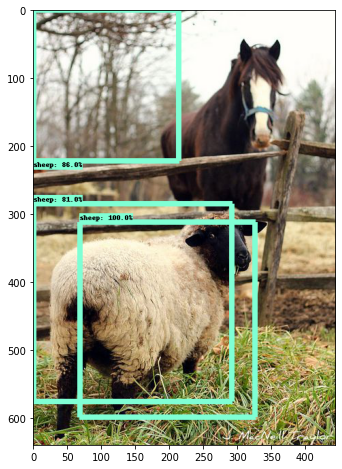

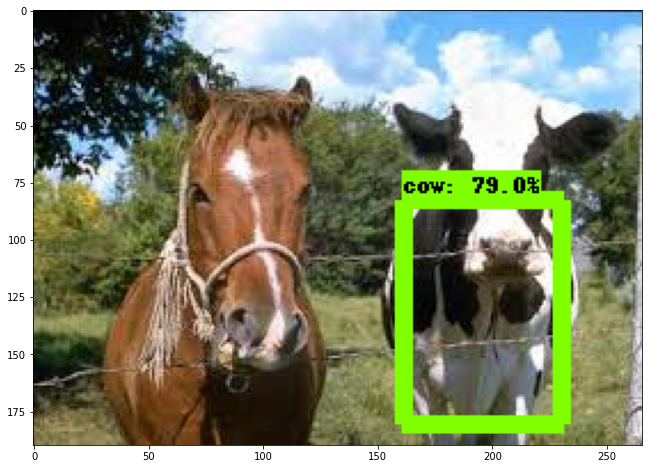

In [32]:
#%cd /content/models/research/object_detection
%cd /content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

sys.path.append("..")
from object_detection.utils import ops as utils_ops

#Esto es necesario para mostrar las imágenes.
%matplotlib inline

from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=num_classes, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

#funcion para analizar inferencia en una imagen
def run_inference_for_single_image(image, graph):
    with graph.as_default():
        with tf.Session() as sess:
            # Obtenga manijas para tensores de entrada y salida
            ops = tf.get_default_graph().get_operations()
            all_tensor_names = {
                output.name for op in ops for output in op.outputs}
            tensor_dict = {}
            for key in [
                'num_detections', 'detection_boxes', 'detection_scores',
                'detection_classes', 'detection_masks'
            ]:
                tensor_name = key + ':0'
                if tensor_name in all_tensor_names:
                    tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
                        tensor_name)
            if 'detection_masks' in tensor_dict:
                # El siguiente procesamiento es solo para una sola imagen
                detection_boxes = tf.squeeze(
                    tensor_dict['detection_boxes'], [0])
                detection_masks = tf.squeeze(
                    tensor_dict['detection_masks'], [0])
                # Es necesario volver a enmarcar para traducir la máscara de las coordenadas del cuadro a las coordenadas de la imagen y ajustar el tamaño de la imagen.
                real_num_detection = tf.cast(
                    tensor_dict['num_detections'][0], tf.int32)
                detection_boxes = tf.slice(detection_boxes, [0, 0], [
                                           real_num_detection, -1])
                detection_masks = tf.slice(detection_masks, [0, 0, 0], [
                                           real_num_detection, -1, -1])
                detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                    detection_masks, detection_boxes, image.shape[0], image.shape[1])
                detection_masks_reframed = tf.cast(
                    tf.greater(detection_masks_reframed, 0.5), tf.uint8)
                # Siga la convención agregando nuevamente la dimensión del lote
                tensor_dict['detection_masks'] = tf.expand_dims(
                    detection_masks_reframed, 0)
            image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

            # Run inference
            output_dict = sess.run(tensor_dict,feed_dict={image_tensor: np.expand_dims(image, 0)})

            # todas las salidas son matrices numpy float32, así que convierta los tipos según corresponda
            output_dict['num_detections'] = int(output_dict['num_detections'][0])
            output_dict['detection_classes'] = output_dict['detection_classes'][0].astype(np.uint8)
            output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
            output_dict['detection_scores'] = output_dict['detection_scores'][0]
            if 'detection_masks' in output_dict:
                output_dict['detection_masks'] = output_dict['detection_masks'][0]
    return output_dict


for image_path in TEST_IMAGE_PATHS:
  print(image_path)
  image = Image.open(image_path)
  # la representación basada en matriz de la imagen se usará más adelante para preparar la imagen resultante con cuadros y etiquetas.
  image_np = load_image_into_numpy_array(image)
  # Amplíe las dimensiones ya que el modelo espera que las imágenes tengan forma: [1, None, None, 3]
  image_np_expanded = np.expand_dims(image_np, axis=0)
  # deteción actual
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualización de los resultados de una detección.
  vis_util.visualize_boxes_and_labels_on_image_array(
    image_np,
    output_dict['detection_boxes'],
    output_dict['detection_classes'],
    output_dict['detection_scores'],
    category_index,
    instance_masks=output_dict.get('detection_masks'),
    use_normalized_coordinates=True,
    line_thickness=8)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)



# Proceso Global


In [33]:
print("fine_tune_checkpoint: "+fine_tune_checkpoint)
print("pb_fname: "+pb_fname)
print("pipeline_fname: "+pipeline_fname)
print("model_dir: "+model_dir)
#!ls -alh {model_dir}
!ls -alh {'/content/gdrive/My\ Drive/deteccion_objetos/models/research/training'}

fine_tune_checkpoint: /content/gdrive/My Drive/deteccion_objetos/models/research/pretrained_model/model.ckpt
pb_fname: /content/fine_tuned_model/frozen_inference_graph.pb
pipeline_fname: /content/gdrive/My Drive/deteccion_objetos/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config
model_dir: training/
total 865M
-rw------- 1 root root  679 Jun  3 17:47 checkpoint
-rw------- 1 root root  29M May 27 22:20 events.out.tfevents.1590618005.d4f2626f2497
-rw------- 1 root root  29M May 27 22:58 events.out.tfevents.1590620305.d4f2626f2497
-rw------- 1 root root  29M May 27 23:14 events.out.tfevents.1590621291.d4f2626f2497
-rw------- 1 root root  29M May 27 23:34 events.out.tfevents.1590622455.d4f2626f2497
-rw------- 1 root root  29M May 31 20:58 events.out.tfevents.1590958062.224ea16a97e4
-rw------- 1 root root  29M Jun  1 19:29 events.out.tfevents.1591039786.1e356ad409df
-rw------- 1 root root  29M Jun  1 19:42 events.out.tfevents.1591040531.1e356ad409df
-rw------- 1 

# Convertir a grafo liviano (tflite):


In [35]:
!python /content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/export_tflite_ssd_graph.py \
--pipeline_config_path=/content/gdrive/My\ Drive/deteccion_objetos/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config \
--trained_checkpoint_prefix=/content/gdrive/My\ Drive/deteccion_objetos/models/research/training/model.ckpt-2004 \
--output_directory=tflite \
--add_postprocessing_op=true


Instructions for updating:
Please use `layer.__call__` method instead.
W0603 19:02:41.601097 139709576619904 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tf_slim/layers/layers.py:1089: Layer.apply (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.__call__` method instead.
INFO:tensorflow:depth of additional conv before box predictor: 0
I0603 19:02:44.136185 139709576619904 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0603 19:02:44.174181 139709576619904 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv before box predictor: 0
I0603 19:02:44.210737 139709576619904 convolutional_box_predictor.py:156] depth of additional conv before box predictor: 0
INFO:tensorflow:depth of additional conv befo